# NumPy and basic plotting by example

[NumPy](https://numpy.org)

`conda install numpy`

[Matplotlib](https://matplotlib.org)

`conda install matplotlib`

Load EEG recordings for 64 channels (i.e. leads) and 99 trials

In [1]:
import numpy as np

In [2]:
EEGs = np.load("EEGs.npy")

type(EEGs)

numpy.ndarray

In [3]:
# [channel, time, trial]

EEGs.shape

(64, 640, 99)

View the EEG time series for channel 23 and trial 10.

In [4]:
# [channel, time, trial]

EEG_c23_t10 = EEGs[23,:,10]

EEG_c23_t10.shape

(640,)

Did we make a copy of any of the original EEG data?

In [5]:
id(EEG_c23_t10[0]) == id(EEGs[23,0,10])

True

View the EEG time series for channel 23 and trial 10.

In [6]:
import matplotlib.pyplot as plt

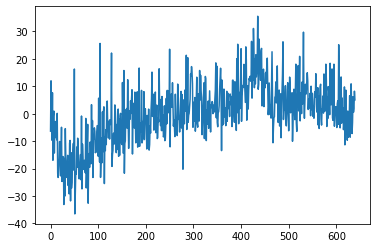

In [7]:
plt.plot(EEG_c23_t10);  # ending `;` supresses text output

Tweaking Matplotlib's display options.

In [8]:
import matplotlib as mpl
mpl.rcParams["axes.labelsize"] = 18
mpl.rcParams["axes.titlesize"] = 20

In [9]:
# retina display only (e.g. MacOS)
%config InlineBackend.figure_format = 'retina'

View the EEG time series for channel 23 and trial 16.

In [10]:
# create a time array in milliseconds for the 640 time pts
dt_ms = 0.1  # sample interval (ms)
time_ms = np.arange(640) * dt_ms

time_ms[:9]

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])

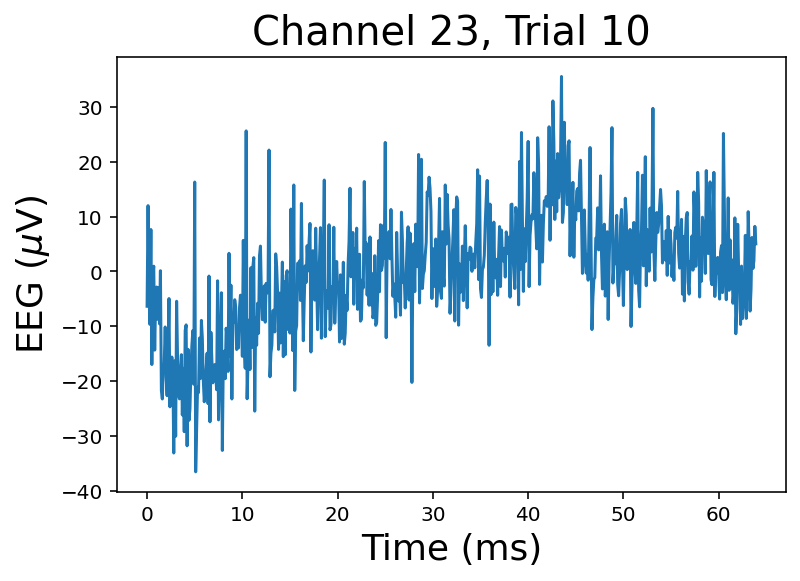

In [11]:
plt.plot(time_ms, EEG_c23_t10)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial 10');

As a side note, NumPy makes it easy to compute functions of arrays.

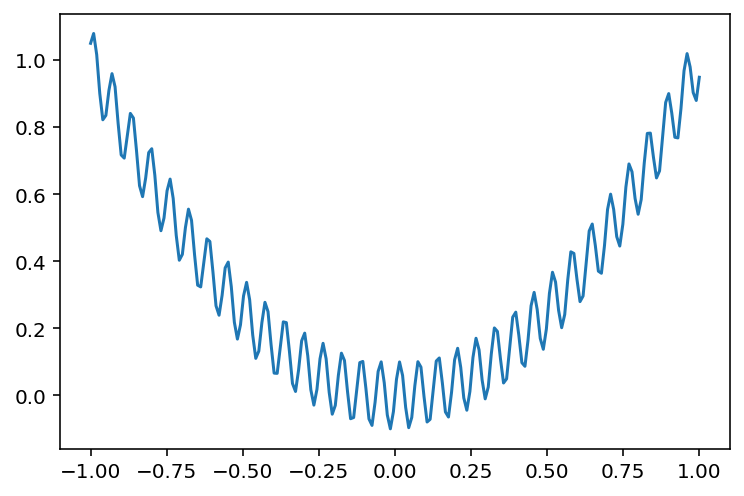

In [12]:
x = np.linspace(-1, 1, 200)
y = x**2 + 0.1 * np.sin(x * 100)

plt.plot(x, y);

Changing the figure size.

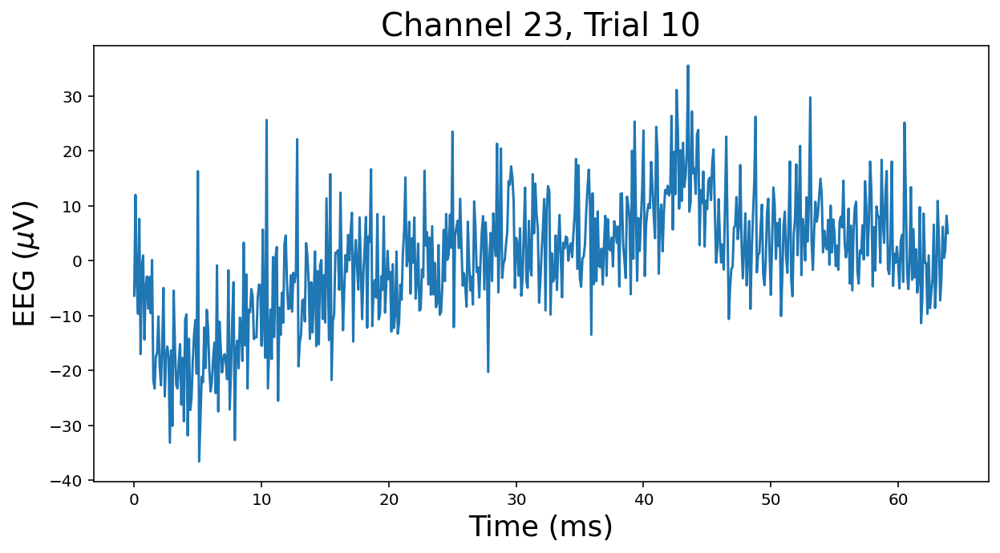

In [13]:
plt.figure(figsize=(10,5))

plt.plot(time_ms, EEG_c23_t10)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial 10');

Changing the default figure size.

In [14]:
mpl.rcParams["figure.figsize"] = (10, 5)

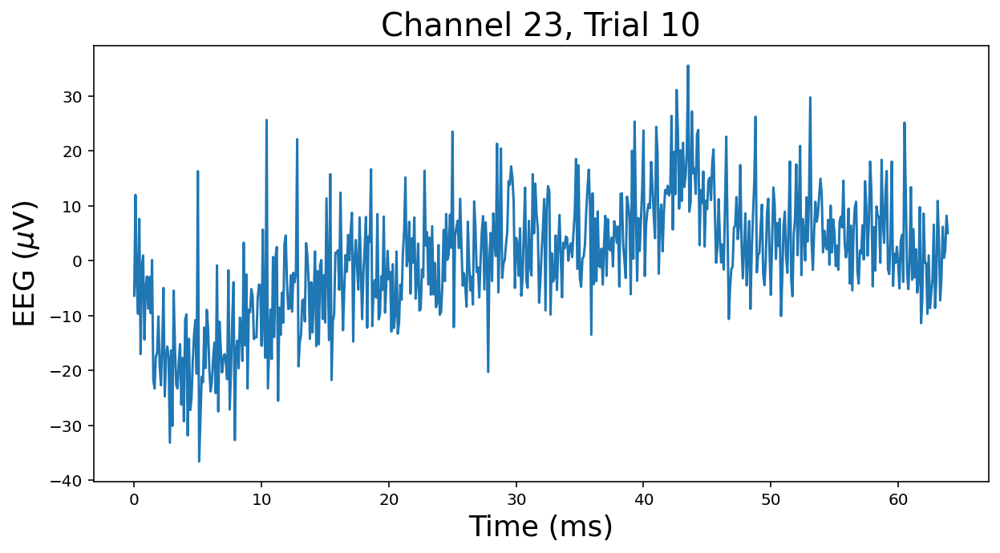

In [15]:
plt.plot(time_ms, EEG_c23_t10)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial 10');

Almost everything can be customized. Here's a couple of quick options, but I leave it up to you to explore on your own how to get your plot to look as you want it to.

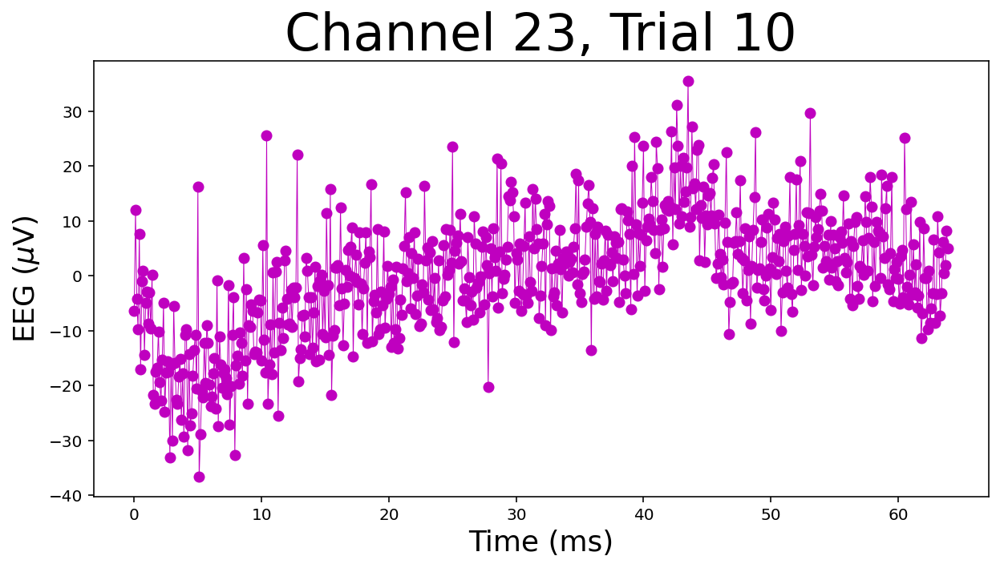

In [16]:
plt.plot(time_ms, EEG_c23_t10, lw=0.5, color='m', marker='o')
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial 10', fontsize=32);

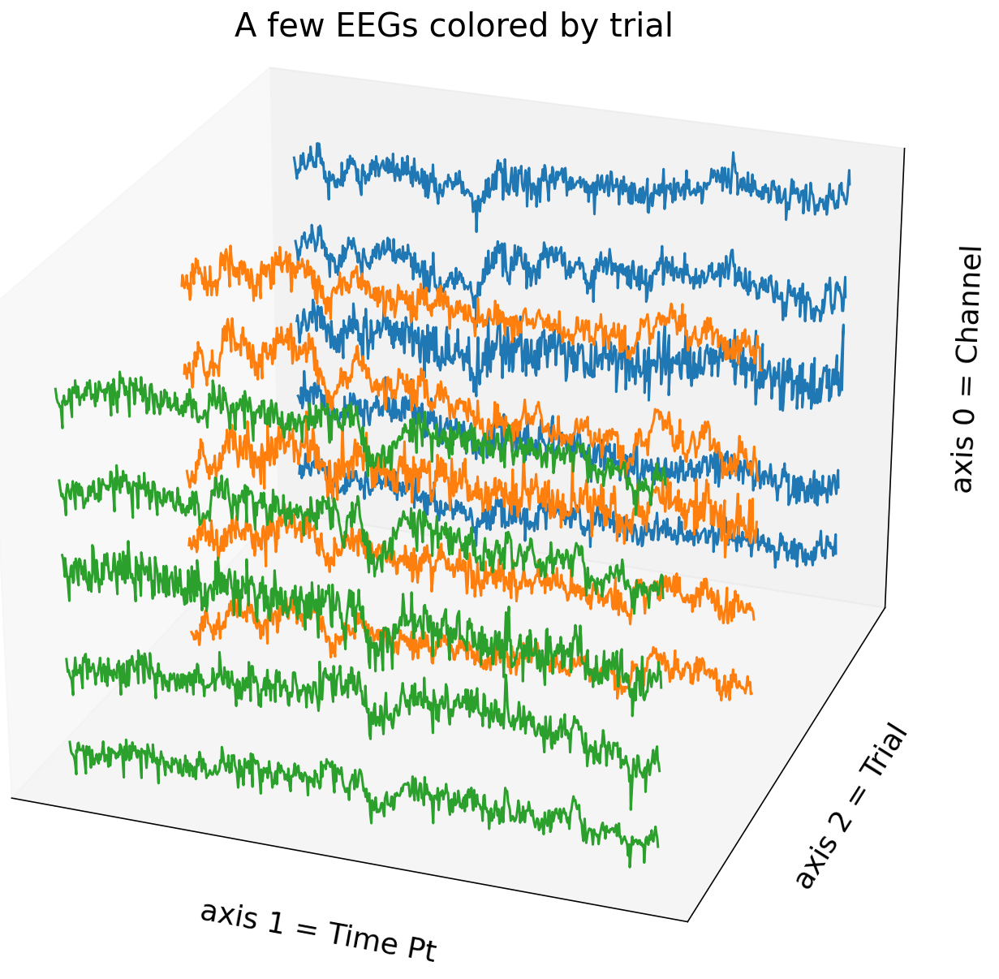

In [17]:
# Visualize EEGs from a few channels and trials
cmap = plt.cm.get_cmap('tab10', 10).colors
figsize3d = (8,8)
dist3d = 8
fig = plt.figure(figsize=figsize3d)
ax = plt.axes(projection='3d')
for channel in range(5):
    for trial in range(3):
        ax.plot(np.arange(640), np.ones(640) * trial, EEGs[channel,:,trial] - 50*channel, color=cmap[trial%10,:])
ax.set_xlabel('axis 1 = Time Pt')
ax.set_ylabel('axis 2 = Trial')
ax.set_zlabel('axis 0 = Channel')
ax.set_title('A few EEGs colored by trial')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(-155, -110)
ax.dist = dist3d
plt.tight_layout();

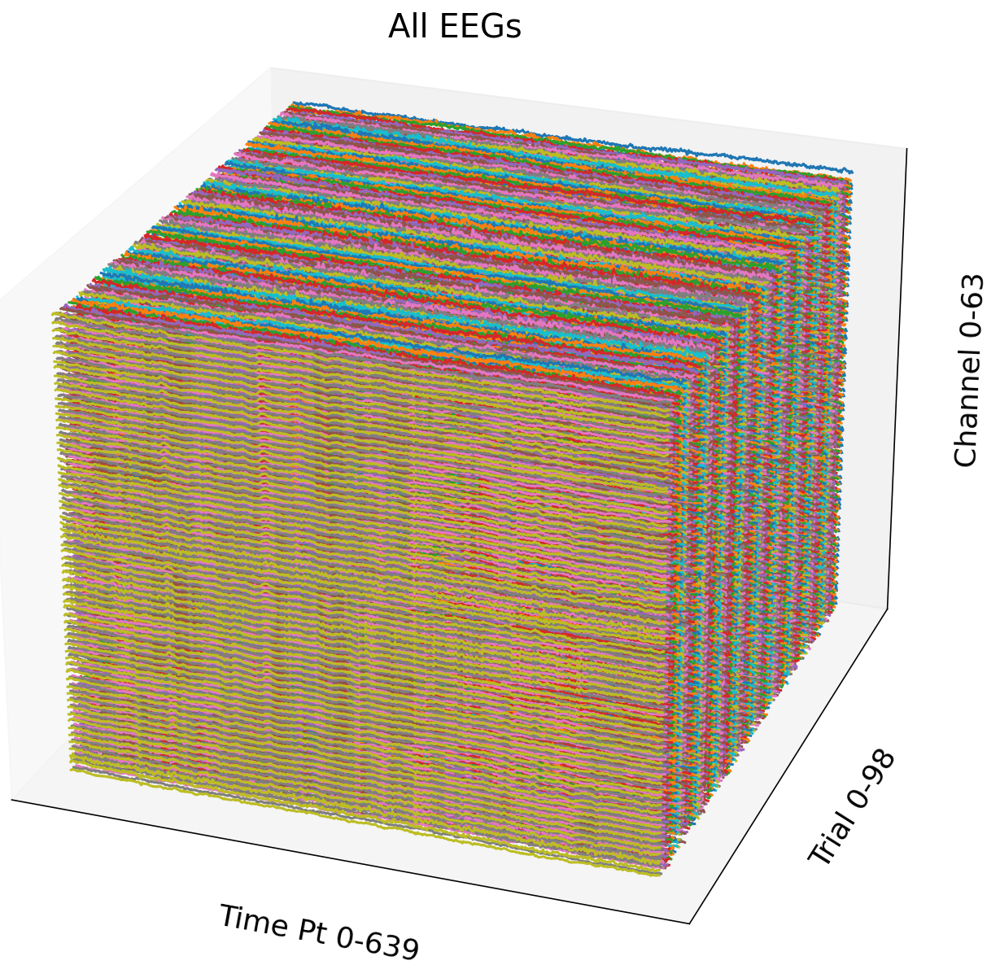

In [18]:
# Visualize all EEGs
fig = plt.figure(figsize=figsize3d)
ax = plt.axes(projection='3d')
for channel in range(64):
    for trial in range(99):
        plt.plot(np.arange(640), np.ones(640) * trial, EEGs[channel,:,trial] - 50*channel, color=cmap[trial%10,:])
ax.set_xlabel('Time Pt 0-639')
ax.set_ylabel('Trial 0-98')
ax.set_zlabel('Channel 0-63')
ax.set_title('All EEGs')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(-155, -110)
ax.dist = dist3d
plt.tight_layout();

Get all EEGs across trials for channel 23.

In [19]:
EEG_23_all = EEGs[23,:,:]

EEG_23_all.shape

(640, 99)

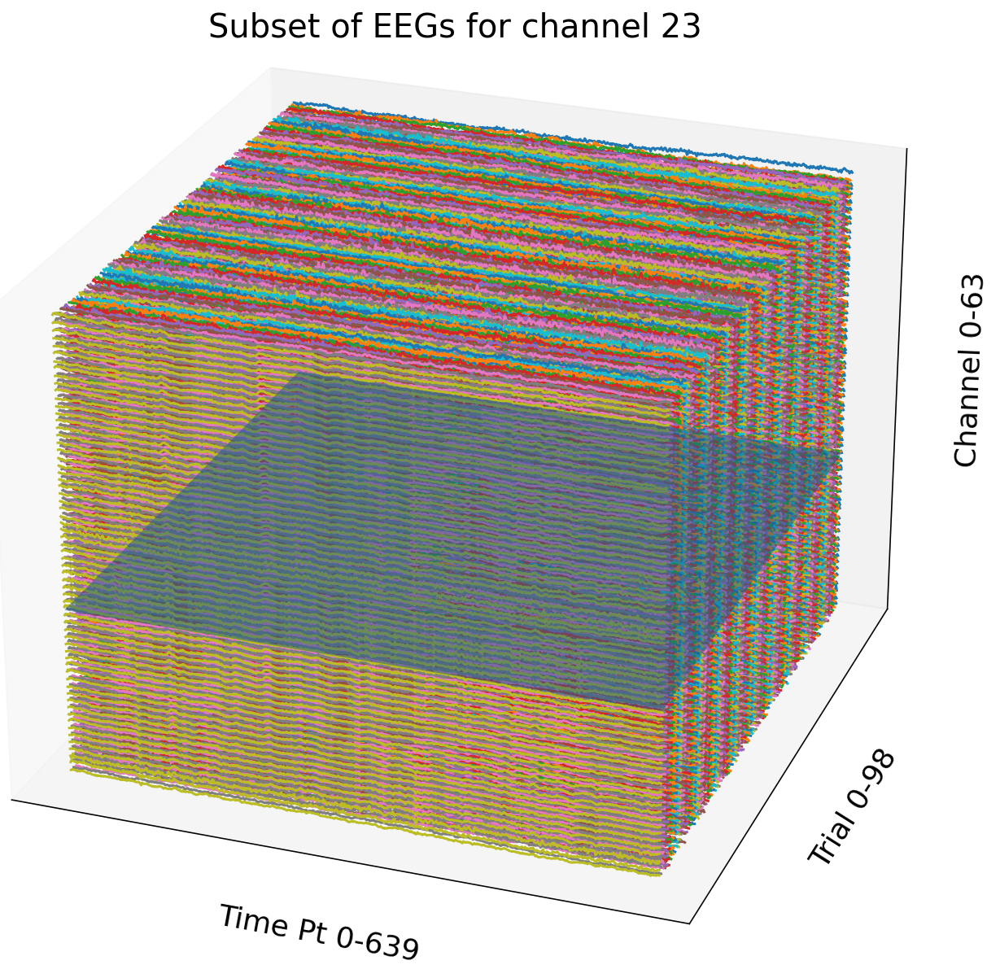

In [20]:
# Visualize subset of EEGs from channel 23
fig = plt.figure(figsize=figsize3d)
ax = plt.axes(projection='3d')
for channel in range(64):
    for trial in range(99):
        plt.plot(np.arange(640), np.ones(640) * trial, EEGs[channel,:,trial] - 50*channel, color=cmap[trial%10,:])
ax.set_xlabel('Time Pt 0-639')
ax.set_ylabel('Trial 0-98')
ax.set_zlabel('Channel 0-63')
ax.set_title('Subset of EEGs for channel 23')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(-155, -110)
ax.dist = dist3d

xx, yy = np.meshgrid(range(640), range(99))
zz = xx.copy()
zz[:] = EEG_23_all.mean() - 50*23
ax.plot_surface(xx, yy, zz, alpha=0.5)

plt.tight_layout();

Compute the average EEG across trials for channel 23.

In [21]:
EEGs[23,:,:].shape

(640, 99)

In [22]:
EEG_23_avg = EEGs[23,:,:].mean(axis=1)

EEG_23_avg.shape

(640,)

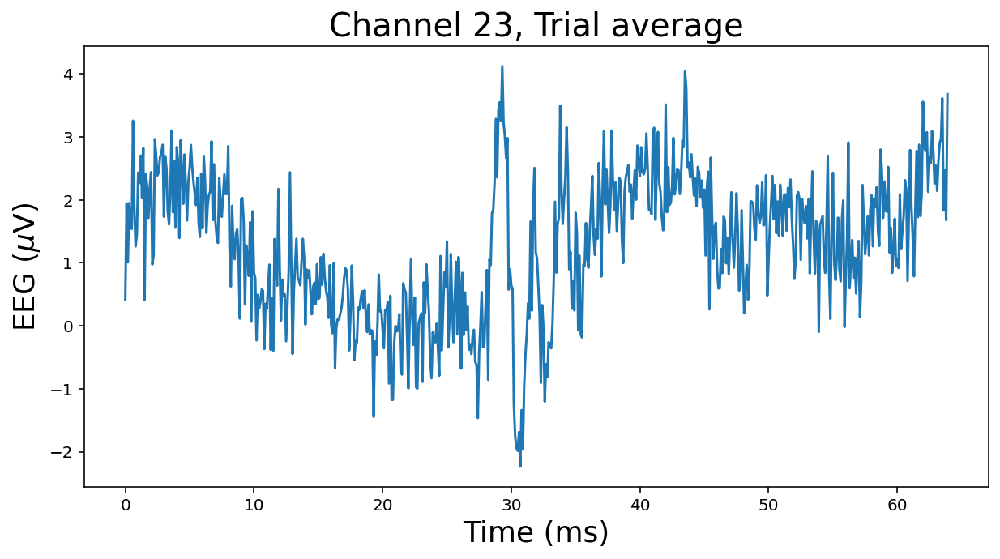

In [23]:
plt.plot(time_ms, EEG_23_avg)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial average');

Overlay multiple plots with a legend.

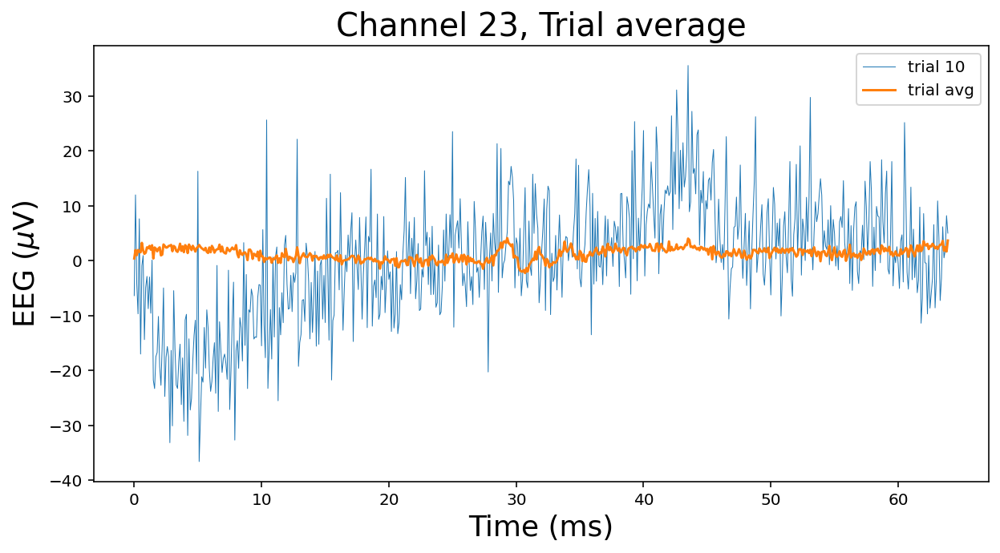

In [24]:
plt.plot(time_ms, EEGs[23,:,10], label='trial 10', lw=0.5)
plt.plot(time_ms, EEG_23_avg, label='trial avg', lw=1.5)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial average')
plt.legend();

Define zoom limits.

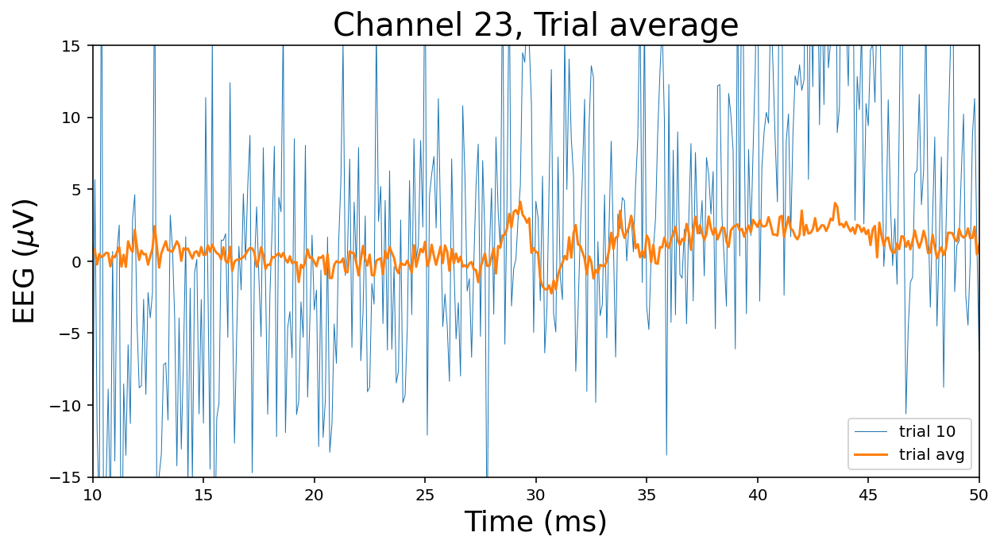

In [25]:
plt.plot(time_ms, EEGs[23,:,10], label='trial 10', lw=0.5)
plt.plot(time_ms, EEG_23_avg, label='trial avg', lw=1.5)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 23, Trial average')
plt.legend()

plt.xlim([10, 50])
plt.ylim([-15, 15]);

Compute the average EEG across trials for all channels.

In [26]:
# EEGs[channel, time, trial]

EEGs_trial_avg = EEGs.mean(axis=2)

EEGs_trial_avg.shape

(64, 640)

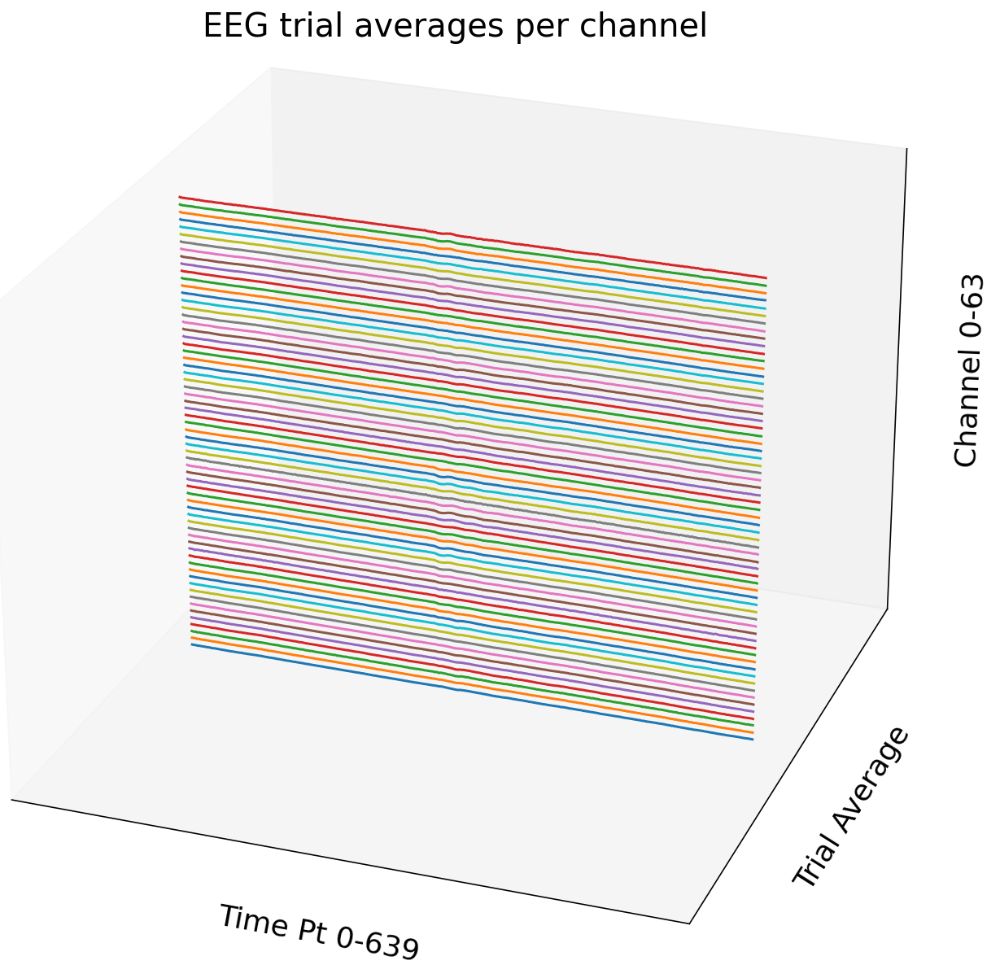

In [27]:
# Visualize trial averages for all channels
fig = plt.figure(figsize=figsize3d)
ax = plt.axes(projection='3d')
for channel in range(64):
    plt.plot(np.arange(640), np.ones(640) * 0, EEGs_trial_avg[channel,:] - 50*channel)
ax.set_xlabel('Time Pt 0-639')
ax.set_ylabel('Trial Average')
ax.set_zlabel('Channel 0-63')
ax.set_title('EEG trial averages per channel')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(-155, -110)
ax.dist = dist3d
plt.tight_layout();

Compute the average EEG across channels for each trial.

In [28]:
# EEGs[channel, time, trial]

EEGs_channel_avg = EEGs.mean(axis=0)

EEGs_channel_avg.shape

(640, 99)

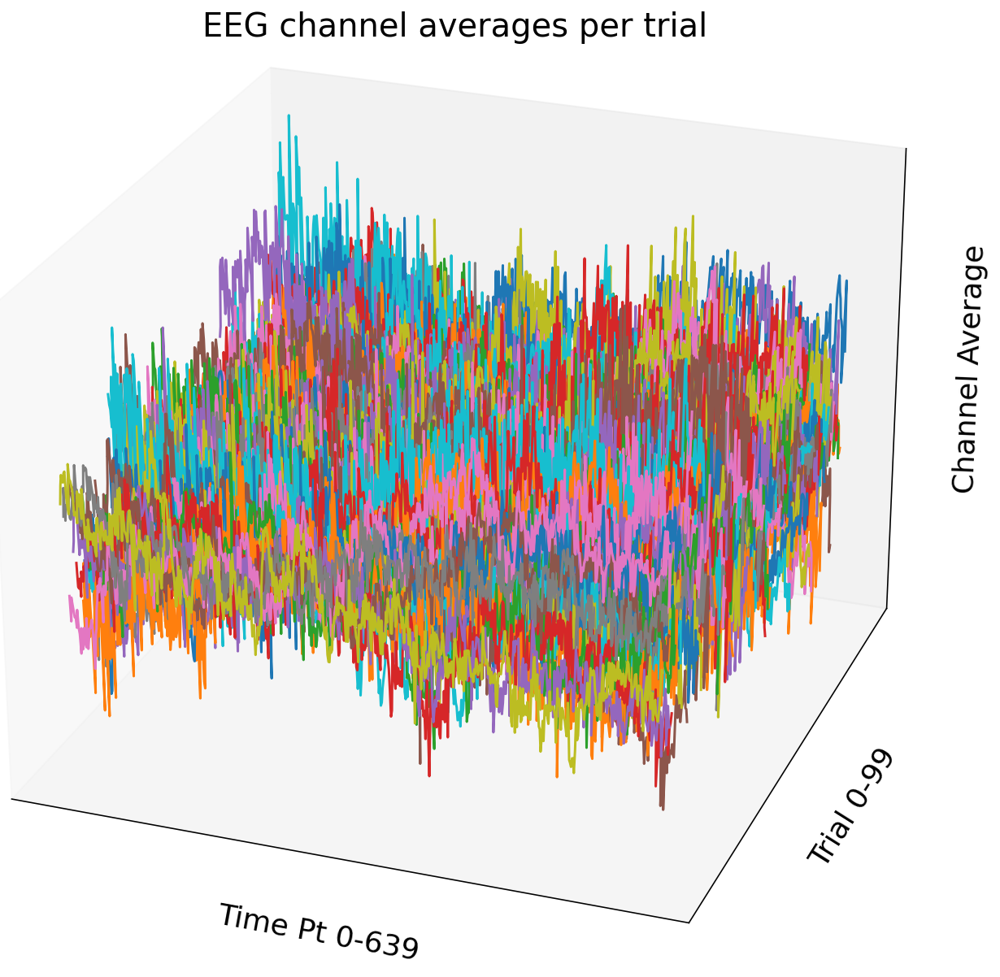

In [29]:
# Visualize channel averages for all trials
fig = plt.figure(figsize=figsize3d)
ax = plt.axes(projection='3d')
for trial in range(99):
    plt.plot(np.arange(640), np.ones(640) * trial, EEGs_channel_avg[:,trial])
ax.set_xlabel('Time Pt 0-639')
ax.set_ylabel('Trial 0-99')
ax.set_zlabel('Channel Average')
ax.set_title('EEG channel averages per trial')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(-155, -110)
ax.dist = dist3d
plt.tight_layout();

## Exercise

Plot the average EEG across the first and last 50 trials for channel 5.

In [ ]:
# EEGs[channel, time, trial]

first50trials = EEGs[...]
last50trials = EEGs[...]

first50trials.shape, last50trials.shape

In [ ]:
first50avg = first50trials.mean(...)
last50avg = last50trials.mean(...)

first50avg.shape, last50avg.shape

In [ ]:
plt.plot(time, first50avg, label='first 50 trials')
plt.plot(time, last50avg, label='last 50 trials')
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Channel 5, Trial average')
plt.legend();

## Exercise

Plot the difference between the trial averages for channels 30 and 40.

In [ ]:
# EEGs[channel, time, trial]

EEG_30_avg = EEGs[...].mean(...)
EEG_40_avg = EEGs[...].mean(...)

diff30vs40 = ...

plt.plot(time, diff30vs40)
plt.xlabel('Time (ms)')
plt.ylabel(r'EEG ($\mu$V)')
plt.title('Difference between channels 30 and 40 trial average');

## Timing your code (NumPy vs pure Python)

In [32]:
%%timeit
# time this cell

tot = 0
for i in range(50000):
    tot += i

2.6 ms ± 36.5 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [33]:
# time a single line
%timeit np.sum(np.arange(50000))

47.6 µs ± 3.16 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


## Interactive plots with Plotly

[Plotly](https://plotly.com/python/getting-started/)

`conda install -c plotly plotly`

To use Plotly in Jupyter notebooks, we will also need ipywidgets:

`conda install ipywidgets` <-- you might need to restart JupyterLab after this

In [34]:
import plotly.express as px

In [35]:
fig = px.line(x=time_ms, y=EEGs[23,:,:].mean(axis=1))
fig.update_layout(xaxis_title='Time', yaxis_title='EEG (uV)', 
                  title='Channel 23 trial average')
fig.show()